In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
try:
    import numpy as np
    import matplotlib.pyplot as plt
    import os
    import time
    import imageio
    from keras.optimizers import Adam
    from keras.models import Sequential
    from keras.layers import Dense
    from keras.layers import Reshape
    from keras.layers import Flatten
    from keras.layers import Conv2D
    from keras.layers import Conv2DTranspose
    from keras.layers import LeakyReLU
    from keras.layers import Dropout
    from keras.preprocessing.image import array_to_img, img_to_array, load_img
    from numpy.random import randn
    from numpy.random import randint
    import tensorflow as tf
except:
    print('Some modules missing.')


Using TensorFlow backend.


In [0]:
##setting the parameters
n_images = 12000
batch_size = 128
latent_dim = 100
n_epoch = 300
img_shape = (128, 128, 3)
print('\n')
print('Parameters for the model are also set.')
print('\n')




Parameters for the model are also set.




In [0]:
##setting the directory of the images into a variable
data_dir = '/content/drive/My Drive/0'
images = os.listdir(data_dir)
images = images[:n_images]
print('\n')
print('Directory for the images also set.')
print('\n')




Directory for the images also set.




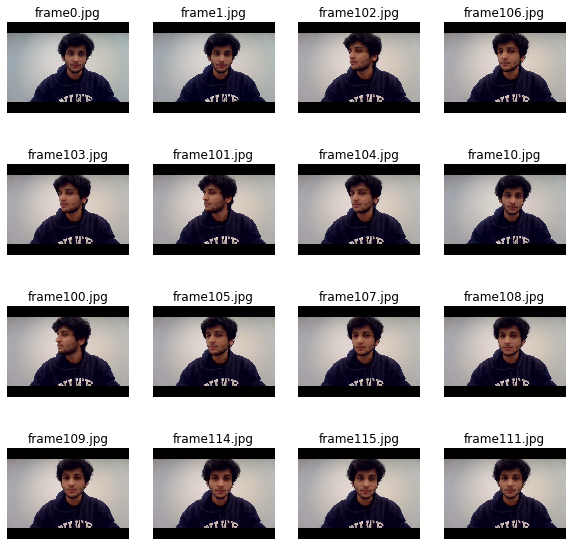

In [0]:
##plotting a section of the images
plt.figure(figsize=(10,10))
for i, name in enumerate(images[:16]):
    plt.subplot(4, 4, i + 1)
    img = plt.imread(data_dir + '/' + name)
    plt.imshow(img)
    plt.title(name)
    plt.axis('off')


In [0]:
##getting the data and preparing it's structure for our model
def get_data(data_path) :
    X = []
    for filename in data_path :
        img = img_to_array(load_img(data_dir + "/" + filename, target_size = img_shape[:2]))
        X.append(img)
    X = np.array(X).astype('float32')
    #X = (X - 127.5) / 127.5
    X = X / 255
    return X
dataset = get_data(images)
print('\n')
print('Data is ready')
print('\n')




Data is ready




In [0]:
##constructing the discriminator
def define_discriminator(in_shape=(128,128,3)):
    model = Sequential()
    # normal
    model.add(Conv2D(128, (5,5), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 64x64
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 32x32
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 16x16
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # downsample to 8x8
    model.add(Conv2D(128, (5,5), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # classifier
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model
print('\n')
print('Function for discriminator also made.')
print('\n')




Function for discriminator also made.




In [0]:
##making the funtion for the generator
def define_generator(latent_dim):
    model = Sequential()
    # foundation for 8x8 feature maps
    n_nodes = 128 * 8 * 8
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((8, 8, 128)))
    # upsample to 16x16
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 32x32
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 64x64
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 128x128
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # output layer 128x128x3
    model.add(Conv2D(3, (5,5), activation='tanh', padding='same'))
    return model

#input of G
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

# use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    # generate points in latent space
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    X = g_model.predict(x_input)
    # create 'fake' class labels (0)
    y = np.zeros((n_samples, 1))
    return X, y
print('\n')
print('Function created for generator.')
print('\n')




Function created for generator.




In [0]:
##creating function for our GAN network
def define_gan(g_model, d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    # connect them
    model = Sequential()
    # add generator
    model.add(g_model)
    # add the discriminator
    model.add(d_model)
    # compile model
    opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

# retrive real samples
def get_real_samples(dataset, n_samples):
    # choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    # set 'real' class labels (1)
    y = np.ones((n_samples, 1))
    return X, y

# create and save a plot of generated images
def show_generated(generated,epoch, n=5):
    #[-1,1] -> [0,1]
    #generated = (generated + 1)/ 2
    #generated = (generated[:n*n] * 127.5) + 127.5
    #generated = generated * 255
    plt.figure(figsize=(10,10))
    for i in range(n * n):
        plt.subplot(n, n, i + 1)
        #img = plt.imread(data_dir + '/' + name)
        plt.imshow(generated[i])
        #plt.title(name)
        plt.axis('off')
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch+1))
    plt.show()

# evaluate the discriminator and plot generated images
def summarize_performance(epoch, g_model, d_model, dataset, latent_dim, n_samples=100):
    # prepare real samples
    X_real, y_real = get_real_samples(dataset, n_samples)
    # evaluate discriminator on real examples
    _, acc_real = d_model.evaluate(X_real, y_real, verbose=0)
    # prepare fake examples
    x_fake, y_fake = generate_fake_samples(g_model, latent_dim, n_samples)
    # evaluate discriminator on fake examples
    _, acc_fake = d_model.evaluate(x_fake, y_fake, verbose=0)
    # summarize discriminator performance
    print('>Accuracy [real: %.0f%%, fake: %.0f%%]' % (acc_real*100, acc_fake*100))
    # show plot
    show_generated(x_fake, epoch)

print('\n')
print('Fuction for our GAN also created')
print('\n')





Fuction for our GAN also created




In [0]:
##creating our function for training of our GAN
def train(g_model, d_model, gan_model, dataset, latent_dim=100, n_epochs=100, n_batch=128):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    start = time.time()
    for i in range(n_epochs):

        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = get_real_samples(dataset, half_batch)
            # update discriminator model weights
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            # generate 'fake' examples
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            # update discriminator model weights
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            # prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = np.ones((n_batch, 1))
            # update the generator via the discriminator's error
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            # summarize loss on this batch
        print('Epoch: %d,  Loss: D_real = %.3f, D_fake = %.3f,  G = %.3f' % (i + 1, d_loss1, d_loss2, g_loss))
        # evaluate the model performance
        if (i + 1) % 10 == 0:
            summarize_performance(i, g_model, d_model, dataset, latent_dim)
    print('Total time for training {} epochs is {} sec'.format(n_epochs, (time.time() - start)))

print('\n')
print('Training Function created.')
print('\n')




Training Function created.








Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Epoch: 1,  Loss: D_real = 0.514, D_fake = 0.699,  G = 0.689
Epoch: 2,  Loss: D_real = 0.001, D_fake = 0.769,  G = 0.654
Epoch: 3,  Loss: D_real = 0.012, D_fake = 0.783,  G = 0.668
Epoch: 4,  Loss: D_real = 0.051, D_fake = 0.746,  G = 0.833
Epoch: 5,  Loss: D_real = 0.010, D_fake = 0.490,  G = 1.458
Epoch: 6,  Loss: D_real = 0.000, D_fake = 0.583,  G = 1.032
Epoch: 7,  Loss: D_real = 0.000, D_fake = 0.513,  G = 1.304
Epoch: 8,  Loss: D_real = 0.000, D_fake = 0.636,  G = 0.777
Epoch: 9,  Loss: D_real = 0.000, D_fake = 0.519,  G = 1.063
Epoch: 10,  Loss: D_real = 0.000, D_fake = 0.191,  G = 2.686


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

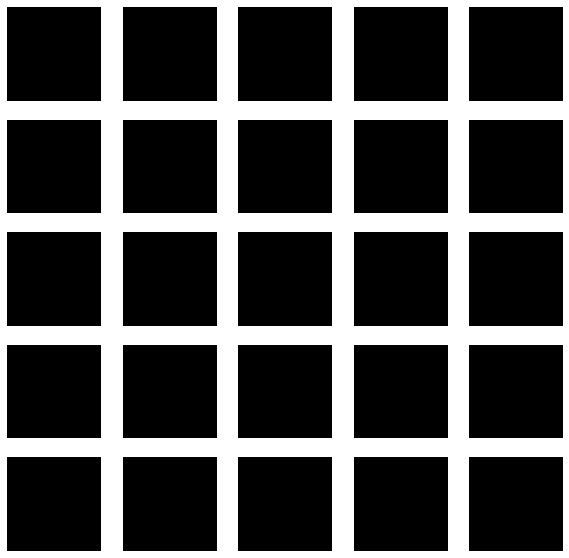

Epoch: 11,  Loss: D_real = 0.000, D_fake = 0.019,  G = 4.779
Epoch: 12,  Loss: D_real = 0.000, D_fake = 0.016,  G = 6.276
Epoch: 13,  Loss: D_real = 0.000, D_fake = 0.000,  G = 9.056
Epoch: 14,  Loss: D_real = 0.000, D_fake = 0.001,  G = 7.409
Epoch: 15,  Loss: D_real = 0.000, D_fake = 0.001,  G = 7.389
Epoch: 16,  Loss: D_real = 0.000, D_fake = 0.001,  G = 7.430
Epoch: 17,  Loss: D_real = 0.000, D_fake = 0.001,  G = 7.547
Epoch: 18,  Loss: D_real = 0.000, D_fake = 0.001,  G = 7.456
Epoch: 19,  Loss: D_real = 0.000, D_fake = 0.001,  G = 7.730
Epoch: 20,  Loss: D_real = 0.000, D_fake = 0.001,  G = 7.769


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

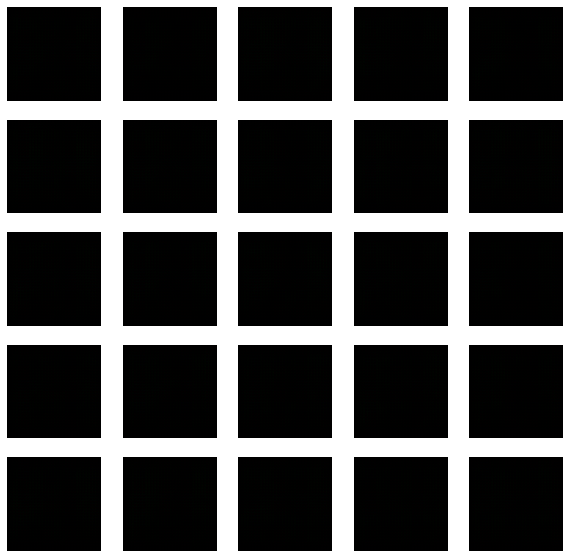

Epoch: 21,  Loss: D_real = 0.000, D_fake = 0.000,  G = 8.078
Epoch: 22,  Loss: D_real = 0.000, D_fake = 0.000,  G = 8.008
Epoch: 23,  Loss: D_real = 0.000, D_fake = 0.000,  G = 8.137
Epoch: 24,  Loss: D_real = 0.000, D_fake = 0.000,  G = 8.324
Epoch: 25,  Loss: D_real = 0.000, D_fake = 0.000,  G = 8.571
Epoch: 26,  Loss: D_real = 0.000, D_fake = 0.000,  G = 8.454
Epoch: 27,  Loss: D_real = 0.000, D_fake = 0.000,  G = 8.679
Epoch: 28,  Loss: D_real = 0.000, D_fake = 0.000,  G = 8.594
Epoch: 29,  Loss: D_real = 0.000, D_fake = 0.001,  G = 8.067
Epoch: 30,  Loss: D_real = 0.000, D_fake = 0.039,  G = 12.152


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

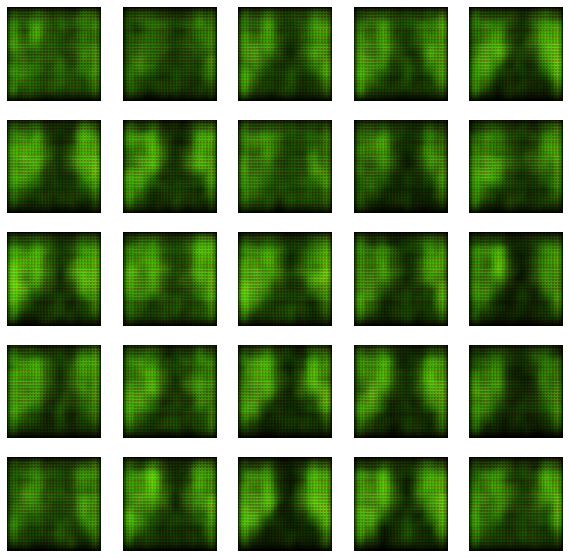

Epoch: 31,  Loss: D_real = 0.000, D_fake = 5.596,  G = 0.354
Epoch: 32,  Loss: D_real = 6.971, D_fake = 0.311,  G = 6.629
Epoch: 33,  Loss: D_real = 0.472, D_fake = 0.622,  G = 1.447
Epoch: 34,  Loss: D_real = 0.148, D_fake = 0.891,  G = 0.755
Epoch: 35,  Loss: D_real = 0.157, D_fake = 0.545,  G = 2.921
Epoch: 36,  Loss: D_real = 0.013, D_fake = 0.010,  G = 6.251
Epoch: 37,  Loss: D_real = 0.005, D_fake = 0.056,  G = 8.099
Epoch: 38,  Loss: D_real = 0.090, D_fake = 0.152,  G = 3.654
Epoch: 39,  Loss: D_real = 0.004, D_fake = 0.318,  G = 6.012
Epoch: 40,  Loss: D_real = 0.177, D_fake = 0.190,  G = 2.528


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

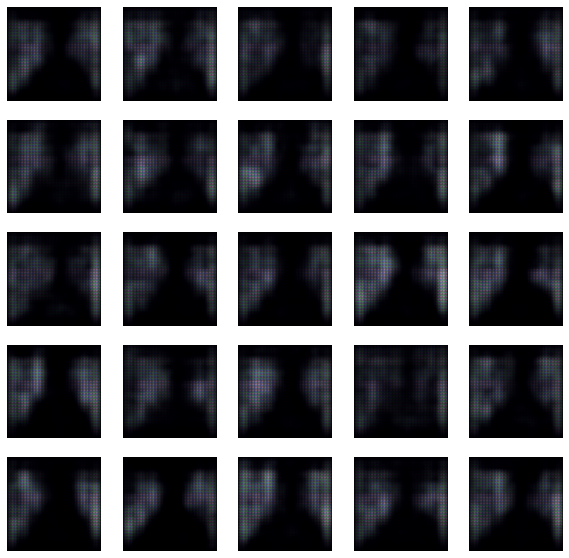

Epoch: 41,  Loss: D_real = 0.008, D_fake = 0.132,  G = 3.718
Epoch: 42,  Loss: D_real = 0.102, D_fake = 0.014,  G = 6.358
Epoch: 43,  Loss: D_real = 0.014, D_fake = 0.138,  G = 8.073
Epoch: 44,  Loss: D_real = 0.381, D_fake = 0.614,  G = 2.066
Epoch: 45,  Loss: D_real = 0.261, D_fake = 0.512,  G = 2.180
Epoch: 46,  Loss: D_real = 0.235, D_fake = 0.219,  G = 3.636
Epoch: 47,  Loss: D_real = 0.122, D_fake = 0.243,  G = 3.934
Epoch: 48,  Loss: D_real = 0.029, D_fake = 0.187,  G = 4.449
Epoch: 49,  Loss: D_real = 2.507, D_fake = 0.741,  G = 1.073
Epoch: 50,  Loss: D_real = 0.066, D_fake = 0.034,  G = 6.437


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

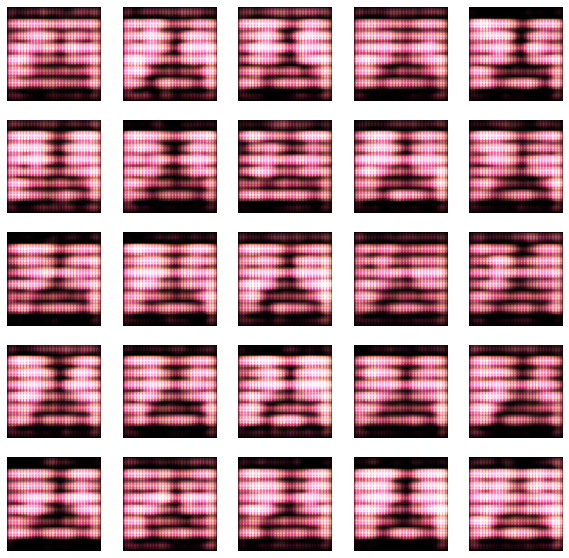

Epoch: 51,  Loss: D_real = 0.010, D_fake = 0.055,  G = 5.438
Epoch: 52,  Loss: D_real = 0.003, D_fake = 0.089,  G = 5.538
Epoch: 53,  Loss: D_real = 0.060, D_fake = 0.341,  G = 5.772
Epoch: 54,  Loss: D_real = 0.001, D_fake = 0.566,  G = 8.860
Epoch: 55,  Loss: D_real = 0.000, D_fake = 0.423,  G = 1.691
Epoch: 56,  Loss: D_real = 0.000, D_fake = 0.116,  G = 3.050
Epoch: 57,  Loss: D_real = 0.000, D_fake = 0.175,  G = 2.408
Epoch: 58,  Loss: D_real = 0.001, D_fake = 0.172,  G = 2.609
Epoch: 59,  Loss: D_real = 0.003, D_fake = 0.055,  G = 3.444
Epoch: 60,  Loss: D_real = 0.002, D_fake = 0.088,  G = 2.831


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


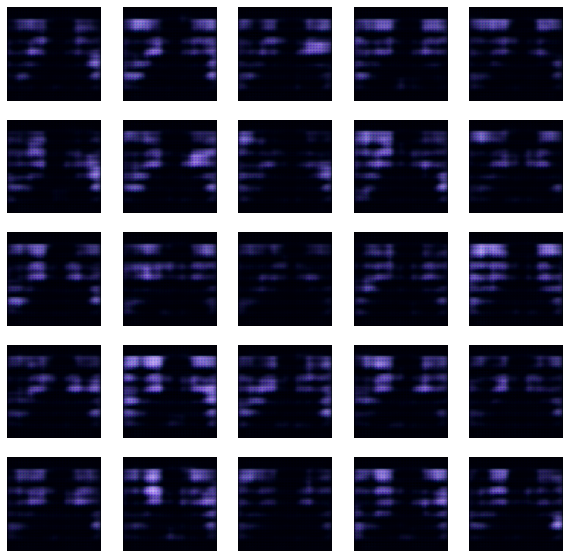

Epoch: 61,  Loss: D_real = 0.002, D_fake = 0.132,  G = 2.370
Epoch: 62,  Loss: D_real = 0.002, D_fake = 0.179,  G = 2.020
Epoch: 63,  Loss: D_real = 0.001, D_fake = 0.161,  G = 2.128
Epoch: 64,  Loss: D_real = 0.001, D_fake = 0.165,  G = 2.306
Epoch: 65,  Loss: D_real = 0.000, D_fake = 0.117,  G = 2.984
Epoch: 66,  Loss: D_real = 0.000, D_fake = 0.076,  G = 3.426
Epoch: 67,  Loss: D_real = 0.000, D_fake = 0.096,  G = 4.100
Epoch: 68,  Loss: D_real = 0.000, D_fake = 0.061,  G = 5.936
Epoch: 69,  Loss: D_real = 0.001, D_fake = 0.028,  G = 10.769
Epoch: 70,  Loss: D_real = 0.004, D_fake = 0.000,  G = 12.388


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

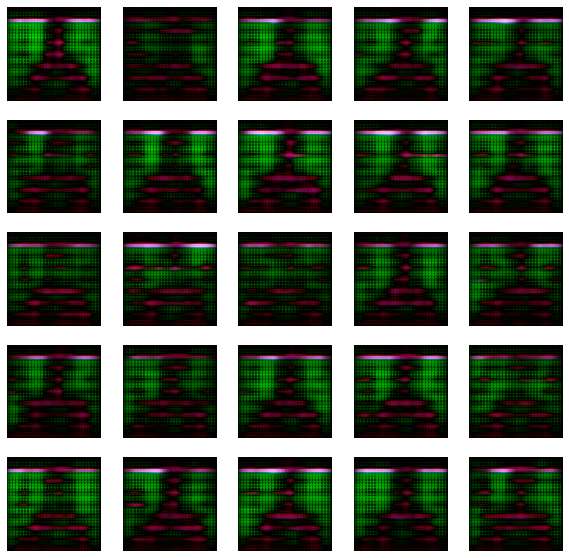

Epoch: 71,  Loss: D_real = 0.001, D_fake = 0.050,  G = 10.485
Epoch: 72,  Loss: D_real = 0.001, D_fake = 0.039,  G = 13.087
Epoch: 73,  Loss: D_real = 0.022, D_fake = 0.003,  G = 8.234
Epoch: 74,  Loss: D_real = 0.000, D_fake = 0.026,  G = 9.697
Epoch: 75,  Loss: D_real = 0.002, D_fake = 0.004,  G = 7.294
Epoch: 76,  Loss: D_real = 0.061, D_fake = 1.365,  G = 16.118
Epoch: 77,  Loss: D_real = 0.571, D_fake = 0.919,  G = 2.121
Epoch: 78,  Loss: D_real = 0.838, D_fake = 0.768,  G = 0.789
Epoch: 79,  Loss: D_real = 0.487, D_fake = 0.404,  G = 2.051
Epoch: 80,  Loss: D_real = 0.315, D_fake = 0.091,  G = 3.700


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

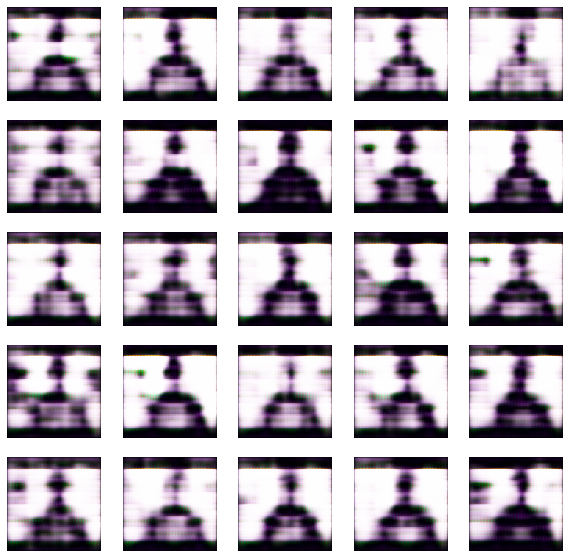

Epoch: 81,  Loss: D_real = 0.182, D_fake = 0.416,  G = 4.888
Epoch: 82,  Loss: D_real = 0.107, D_fake = 0.392,  G = 2.251
Epoch: 83,  Loss: D_real = 0.186, D_fake = 0.274,  G = 2.137
Epoch: 84,  Loss: D_real = 0.118, D_fake = 0.158,  G = 2.703
Epoch: 85,  Loss: D_real = 0.102, D_fake = 0.219,  G = 3.255
Epoch: 86,  Loss: D_real = 0.134, D_fake = 0.147,  G = 3.277
Epoch: 87,  Loss: D_real = 0.174, D_fake = 0.247,  G = 3.779
Epoch: 88,  Loss: D_real = 0.134, D_fake = 0.178,  G = 3.832
Epoch: 89,  Loss: D_real = 0.082, D_fake = 0.170,  G = 3.862
Epoch: 90,  Loss: D_real = 0.097, D_fake = 0.091,  G = 3.486


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

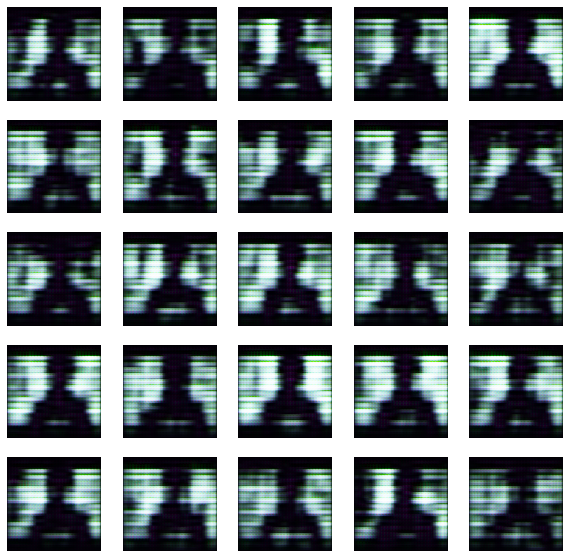

Epoch: 91,  Loss: D_real = 0.071, D_fake = 0.123,  G = 3.335
Epoch: 92,  Loss: D_real = 0.056, D_fake = 0.107,  G = 3.904
Epoch: 93,  Loss: D_real = 0.093, D_fake = 0.088,  G = 3.876
Epoch: 94,  Loss: D_real = 0.081, D_fake = 0.058,  G = 4.372
Epoch: 95,  Loss: D_real = 0.087, D_fake = 0.147,  G = 5.824
Epoch: 96,  Loss: D_real = 0.032, D_fake = 0.087,  G = 6.534
Epoch: 97,  Loss: D_real = 2.494, D_fake = 0.434,  G = 1.783
Epoch: 98,  Loss: D_real = 0.022, D_fake = 0.044,  G = 4.259
Epoch: 99,  Loss: D_real = 0.048, D_fake = 0.281,  G = 3.530
Epoch: 100,  Loss: D_real = 0.055, D_fake = 0.164,  G = 4.439


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

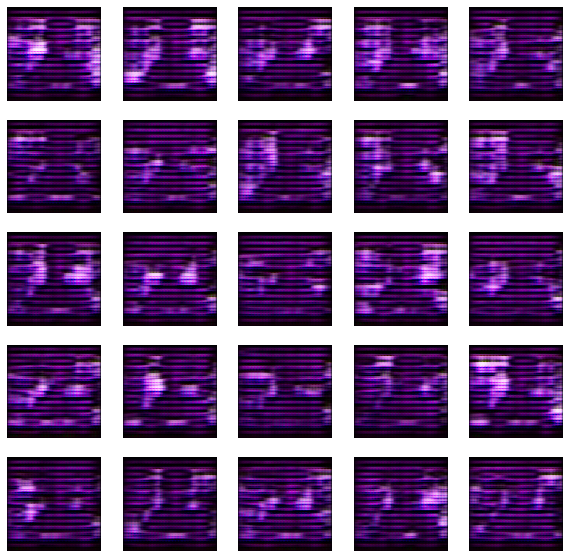

Epoch: 101,  Loss: D_real = 0.018, D_fake = 0.097,  G = 4.486
Epoch: 102,  Loss: D_real = 0.005, D_fake = 0.222,  G = 3.403
Epoch: 103,  Loss: D_real = 0.043, D_fake = 0.038,  G = 4.113
Epoch: 104,  Loss: D_real = 0.009, D_fake = 0.054,  G = 3.722
Epoch: 105,  Loss: D_real = 0.010, D_fake = 0.052,  G = 3.564
Epoch: 106,  Loss: D_real = 0.013, D_fake = 0.053,  G = 3.530
Epoch: 107,  Loss: D_real = 0.016, D_fake = 0.068,  G = 4.001
Epoch: 108,  Loss: D_real = 0.033, D_fake = 0.075,  G = 4.365
Epoch: 109,  Loss: D_real = 0.053, D_fake = 0.124,  G = 7.209
Epoch: 110,  Loss: D_real = 2.109, D_fake = 2.466,  G = 9.530


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 0%, fake: 87%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

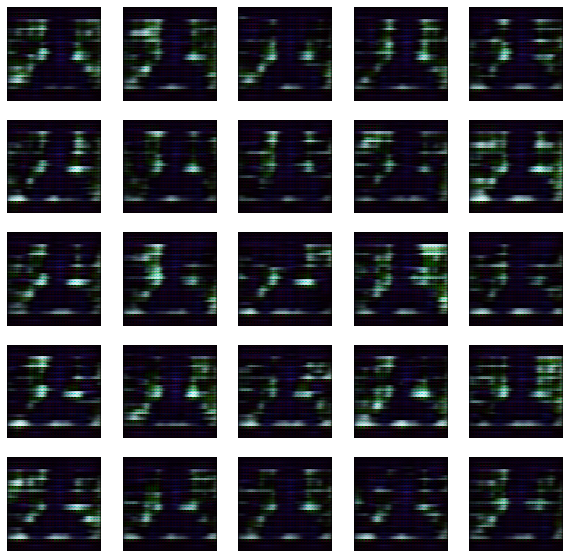

Epoch: 111,  Loss: D_real = 0.003, D_fake = 0.255,  G = 2.366
Epoch: 112,  Loss: D_real = 0.003, D_fake = 0.143,  G = 2.522
Epoch: 113,  Loss: D_real = 0.004, D_fake = 0.277,  G = 2.525
Epoch: 114,  Loss: D_real = 0.027, D_fake = 0.162,  G = 3.123
Epoch: 115,  Loss: D_real = 0.014, D_fake = 0.036,  G = 4.211
Epoch: 116,  Loss: D_real = 0.006, D_fake = 0.031,  G = 4.072
Epoch: 117,  Loss: D_real = 0.004, D_fake = 0.058,  G = 3.786
Epoch: 118,  Loss: D_real = 0.017, D_fake = 0.080,  G = 4.065
Epoch: 119,  Loss: D_real = 0.049, D_fake = 0.087,  G = 5.329
Epoch: 120,  Loss: D_real = 0.427, D_fake = 0.913,  G = 14.696


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

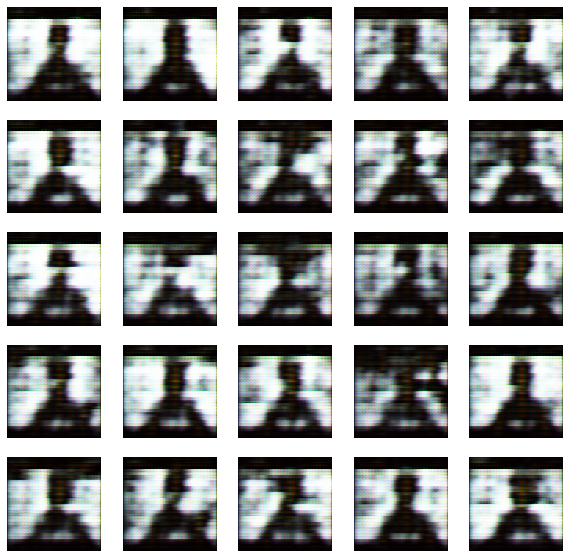

Epoch: 121,  Loss: D_real = 0.050, D_fake = 0.084,  G = 6.487
Epoch: 122,  Loss: D_real = 3.986, D_fake = 0.026,  G = 3.046
Epoch: 123,  Loss: D_real = 0.002, D_fake = 0.114,  G = 2.782
Epoch: 124,  Loss: D_real = 0.002, D_fake = 0.053,  G = 3.390
Epoch: 125,  Loss: D_real = 0.002, D_fake = 0.036,  G = 3.543
Epoch: 126,  Loss: D_real = 0.002, D_fake = 0.038,  G = 3.697
Epoch: 127,  Loss: D_real = 0.003, D_fake = 0.034,  G = 3.627
Epoch: 128,  Loss: D_real = 0.004, D_fake = 0.060,  G = 3.488
Epoch: 129,  Loss: D_real = 0.007, D_fake = 0.117,  G = 3.464
Epoch: 130,  Loss: D_real = 0.110, D_fake = 0.437,  G = 4.881


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 0%, fake: 99%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

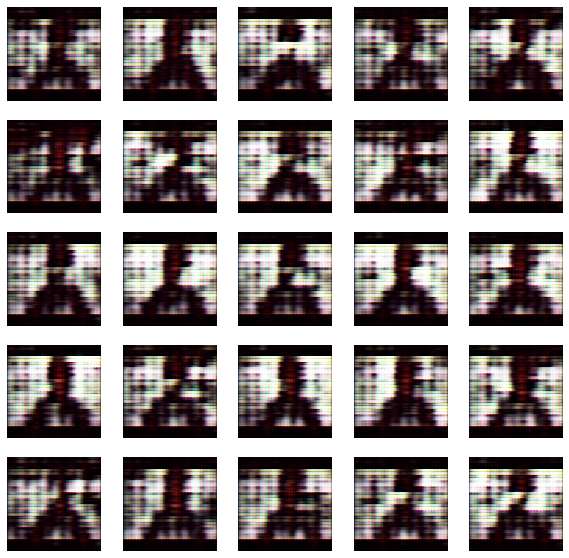

Epoch: 131,  Loss: D_real = 0.003, D_fake = 0.474,  G = 2.832
Epoch: 132,  Loss: D_real = 0.034, D_fake = 0.025,  G = 4.583
Epoch: 133,  Loss: D_real = 0.034, D_fake = 0.052,  G = 3.420
Epoch: 134,  Loss: D_real = 0.018, D_fake = 0.100,  G = 3.382
Epoch: 135,  Loss: D_real = 0.030, D_fake = 0.106,  G = 3.630
Epoch: 136,  Loss: D_real = 0.079, D_fake = 0.217,  G = 4.071
Epoch: 137,  Loss: D_real = 0.023, D_fake = 0.072,  G = 5.206
Epoch: 138,  Loss: D_real = 0.021, D_fake = 0.039,  G = 4.748
Epoch: 139,  Loss: D_real = 0.007, D_fake = 0.127,  G = 5.863
Epoch: 140,  Loss: D_real = 0.010, D_fake = 0.303,  G = 7.026


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 86%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

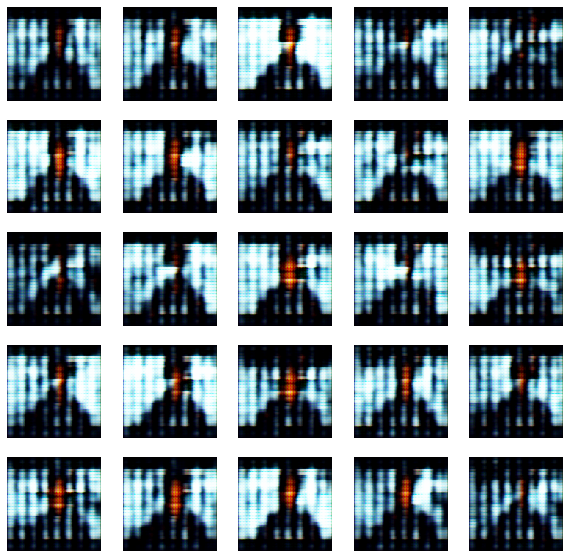

Epoch: 141,  Loss: D_real = 0.026, D_fake = 0.003,  G = 7.003
Epoch: 142,  Loss: D_real = 0.006, D_fake = 0.183,  G = 5.246
Epoch: 143,  Loss: D_real = 0.106, D_fake = 0.102,  G = 4.261
Epoch: 144,  Loss: D_real = 0.053, D_fake = 0.069,  G = 4.645
Epoch: 145,  Loss: D_real = 0.095, D_fake = 0.040,  G = 3.795
Epoch: 146,  Loss: D_real = 0.062, D_fake = 0.070,  G = 4.556
Epoch: 147,  Loss: D_real = 0.080, D_fake = 0.126,  G = 4.746
Epoch: 148,  Loss: D_real = 0.064, D_fake = 0.060,  G = 4.283
Epoch: 149,  Loss: D_real = 0.096, D_fake = 0.122,  G = 5.191
Epoch: 150,  Loss: D_real = 0.077, D_fake = 0.032,  G = 4.216


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

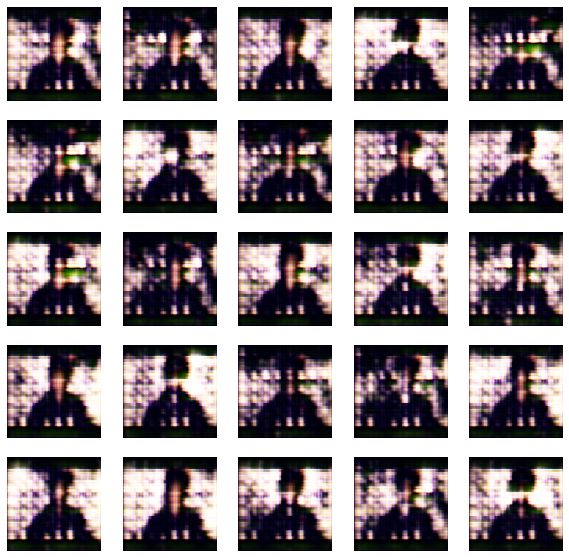

Epoch: 151,  Loss: D_real = 0.039, D_fake = 0.020,  G = 4.886
Epoch: 152,  Loss: D_real = 0.058, D_fake = 0.050,  G = 4.893
Epoch: 153,  Loss: D_real = 0.043, D_fake = 0.044,  G = 5.497
Epoch: 154,  Loss: D_real = 0.027, D_fake = 0.040,  G = 5.543
Epoch: 155,  Loss: D_real = 0.033, D_fake = 0.041,  G = 5.513
Epoch: 156,  Loss: D_real = 0.056, D_fake = 0.105,  G = 6.872
Epoch: 157,  Loss: D_real = 12.541, D_fake = 2.036,  G = 10.803
Epoch: 158,  Loss: D_real = 0.059, D_fake = 0.605,  G = 1.526
Epoch: 159,  Loss: D_real = 0.171, D_fake = 0.231,  G = 1.982
Epoch: 160,  Loss: D_real = 0.085, D_fake = 0.185,  G = 2.090


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

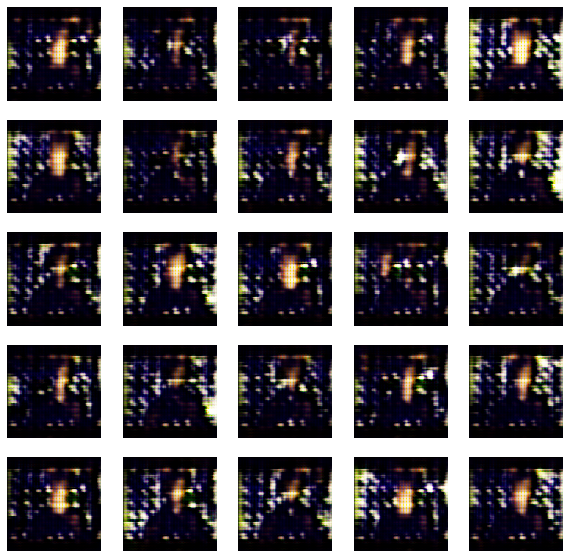

Epoch: 161,  Loss: D_real = 0.061, D_fake = 0.250,  G = 2.086
Epoch: 162,  Loss: D_real = 0.065, D_fake = 0.126,  G = 2.687
Epoch: 163,  Loss: D_real = 0.040, D_fake = 0.107,  G = 2.805
Epoch: 164,  Loss: D_real = 0.021, D_fake = 0.194,  G = 2.270
Epoch: 165,  Loss: D_real = 0.016, D_fake = 0.262,  G = 2.293
Epoch: 166,  Loss: D_real = 0.007, D_fake = 0.042,  G = 4.141
Epoch: 167,  Loss: D_real = 0.003, D_fake = 0.028,  G = 4.256
Epoch: 168,  Loss: D_real = 0.008, D_fake = 0.421,  G = 5.647
Epoch: 169,  Loss: D_real = 0.017, D_fake = 0.208,  G = 3.394
Epoch: 170,  Loss: D_real = 0.094, D_fake = 0.055,  G = 4.027


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

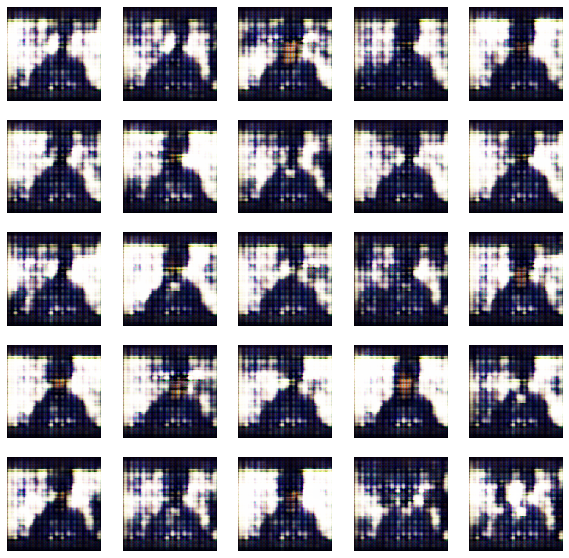

Epoch: 171,  Loss: D_real = 0.046, D_fake = 0.087,  G = 4.014
Epoch: 172,  Loss: D_real = 0.143, D_fake = 0.129,  G = 3.100
Epoch: 173,  Loss: D_real = 0.195, D_fake = 0.229,  G = 3.795
Epoch: 174,  Loss: D_real = 0.064, D_fake = 0.099,  G = 4.306
Epoch: 175,  Loss: D_real = 0.079, D_fake = 0.100,  G = 4.577
Epoch: 176,  Loss: D_real = 0.098, D_fake = 0.115,  G = 4.576
Epoch: 177,  Loss: D_real = 0.151, D_fake = 0.094,  G = 4.056
Epoch: 178,  Loss: D_real = 0.118, D_fake = 0.123,  G = 5.135
Epoch: 179,  Loss: D_real = 0.056, D_fake = 0.145,  G = 5.576
Epoch: 180,  Loss: D_real = 0.145, D_fake = 0.129,  G = 4.643


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

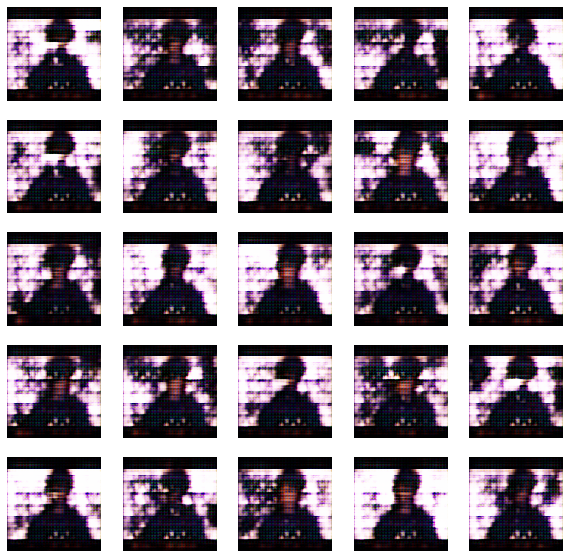

Epoch: 181,  Loss: D_real = 0.063, D_fake = 0.106,  G = 4.675
Epoch: 182,  Loss: D_real = 0.037, D_fake = 0.022,  G = 5.762
Epoch: 183,  Loss: D_real = 0.018, D_fake = 0.039,  G = 6.240
Epoch: 184,  Loss: D_real = 0.021, D_fake = 0.059,  G = 6.967
Epoch: 185,  Loss: D_real = 0.032, D_fake = 0.092,  G = 7.885
Epoch: 186,  Loss: D_real = 4.864, D_fake = 5.029,  G = 0.314
Epoch: 187,  Loss: D_real = 0.004, D_fake = 0.145,  G = 4.343
Epoch: 188,  Loss: D_real = 9.184, D_fake = 1.418,  G = 9.713
Epoch: 189,  Loss: D_real = 0.733, D_fake = 0.848,  G = 1.413
Epoch: 190,  Loss: D_real = 0.211, D_fake = 0.023,  G = 5.065


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

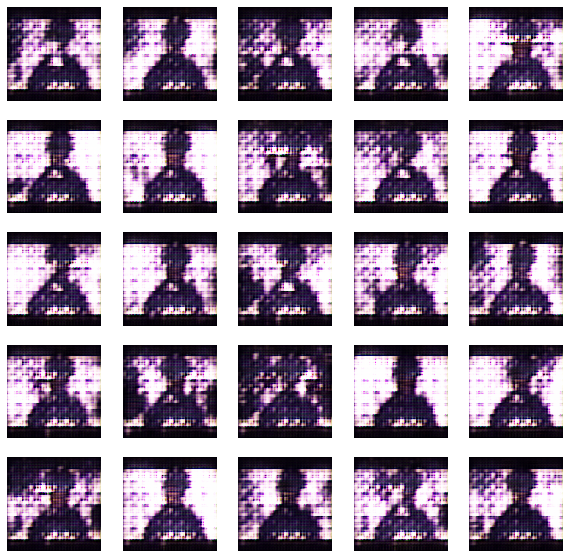

Epoch: 191,  Loss: D_real = 0.026, D_fake = 0.155,  G = 4.844
Epoch: 192,  Loss: D_real = 0.088, D_fake = 0.223,  G = 4.345
Epoch: 193,  Loss: D_real = 0.116, D_fake = 0.146,  G = 3.627
Epoch: 194,  Loss: D_real = 0.131, D_fake = 0.103,  G = 3.321
Epoch: 195,  Loss: D_real = 0.145, D_fake = 0.165,  G = 3.236
Epoch: 196,  Loss: D_real = 0.174, D_fake = 0.149,  G = 3.373
Epoch: 197,  Loss: D_real = 0.150, D_fake = 0.113,  G = 3.746
Epoch: 198,  Loss: D_real = 0.102, D_fake = 0.116,  G = 4.010
Epoch: 199,  Loss: D_real = 0.094, D_fake = 0.158,  G = 4.440
Epoch: 200,  Loss: D_real = 0.126, D_fake = 0.114,  G = 3.847


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

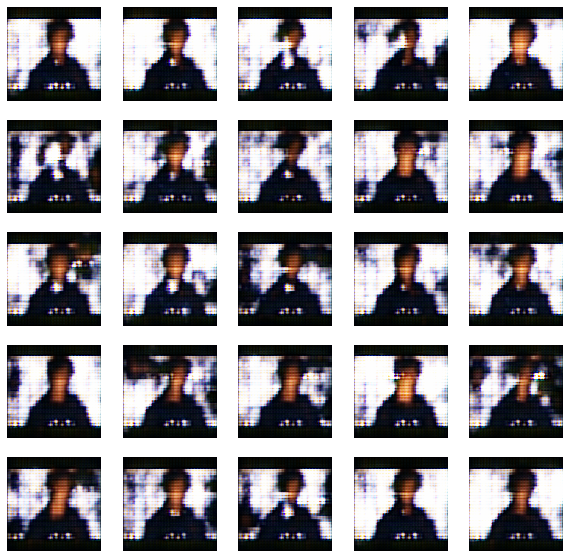

Epoch: 201,  Loss: D_real = 0.134, D_fake = 0.137,  G = 4.084
Epoch: 202,  Loss: D_real = 0.196, D_fake = 0.166,  G = 4.393
Epoch: 203,  Loss: D_real = 0.102, D_fake = 0.166,  G = 4.774
Epoch: 204,  Loss: D_real = 0.146, D_fake = 0.112,  G = 4.695
Epoch: 205,  Loss: D_real = 0.081, D_fake = 0.113,  G = 4.684
Epoch: 206,  Loss: D_real = 0.056, D_fake = 0.066,  G = 4.102
Epoch: 207,  Loss: D_real = 0.043, D_fake = 0.034,  G = 4.146
Epoch: 208,  Loss: D_real = 0.038, D_fake = 0.048,  G = 4.100
Epoch: 209,  Loss: D_real = 0.031, D_fake = 0.040,  G = 4.053
Epoch: 210,  Loss: D_real = 0.045, D_fake = 0.050,  G = 4.447


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

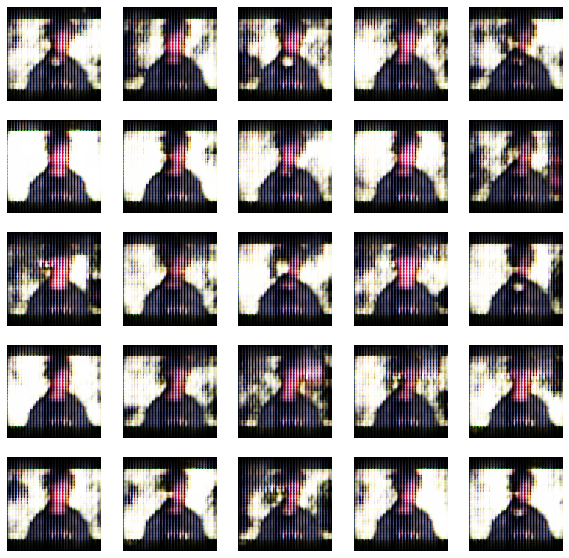

Epoch: 211,  Loss: D_real = 0.032, D_fake = 0.019,  G = 5.229
Epoch: 212,  Loss: D_real = 0.009, D_fake = 0.019,  G = 5.479
Epoch: 213,  Loss: D_real = 0.016, D_fake = 0.026,  G = 5.062
Epoch: 214,  Loss: D_real = 0.017, D_fake = 0.034,  G = 4.776
Epoch: 215,  Loss: D_real = 0.023, D_fake = 0.036,  G = 5.049
Epoch: 216,  Loss: D_real = 0.027, D_fake = 0.048,  G = 5.144
Epoch: 217,  Loss: D_real = 0.042, D_fake = 0.082,  G = 5.863
Epoch: 218,  Loss: D_real = 0.009, D_fake = 0.045,  G = 5.727
Epoch: 219,  Loss: D_real = 0.029, D_fake = 0.103,  G = 6.599
Epoch: 220,  Loss: D_real = 0.925, D_fake = 2.050,  G = 0.394


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 0%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

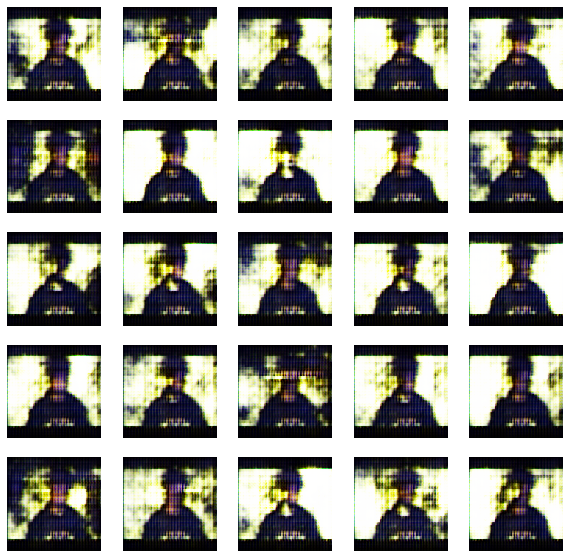

Epoch: 221,  Loss: D_real = 0.072, D_fake = 0.354,  G = 2.174
Epoch: 222,  Loss: D_real = 0.219, D_fake = 0.242,  G = 2.221
Epoch: 223,  Loss: D_real = 0.155, D_fake = 0.227,  G = 2.630
Epoch: 224,  Loss: D_real = 0.125, D_fake = 0.208,  G = 2.553
Epoch: 225,  Loss: D_real = 0.103, D_fake = 0.202,  G = 3.050
Epoch: 226,  Loss: D_real = 0.132, D_fake = 0.223,  G = 3.998
Epoch: 227,  Loss: D_real = 0.070, D_fake = 0.172,  G = 3.897
Epoch: 228,  Loss: D_real = 0.122, D_fake = 0.170,  G = 4.257
Epoch: 229,  Loss: D_real = 0.067, D_fake = 0.093,  G = 3.419
Epoch: 230,  Loss: D_real = 0.094, D_fake = 0.145,  G = 3.783


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

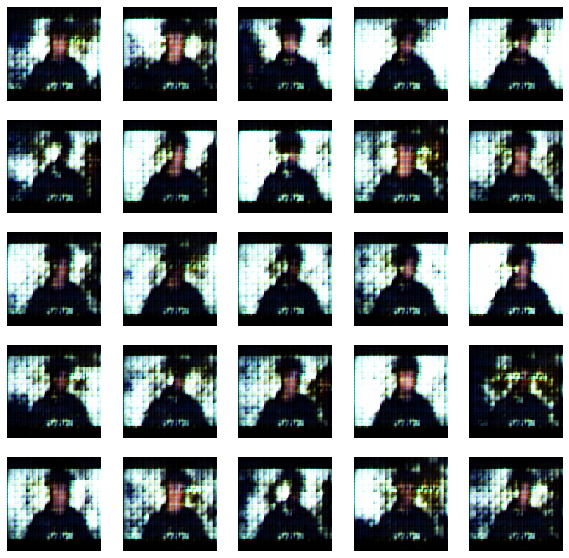

Epoch: 231,  Loss: D_real = 0.088, D_fake = 0.164,  G = 4.049
Epoch: 232,  Loss: D_real = 0.098, D_fake = 0.115,  G = 3.850
Epoch: 233,  Loss: D_real = 0.617, D_fake = 2.594,  G = 7.499
Epoch: 234,  Loss: D_real = 0.043, D_fake = 0.630,  G = 2.589
Epoch: 235,  Loss: D_real = 0.218, D_fake = 0.147,  G = 2.837
Epoch: 236,  Loss: D_real = 0.186, D_fake = 0.173,  G = 3.381
Epoch: 237,  Loss: D_real = 0.163, D_fake = 0.155,  G = 4.046
Epoch: 238,  Loss: D_real = 0.076, D_fake = 0.082,  G = 4.685
Epoch: 239,  Loss: D_real = 0.094, D_fake = 0.054,  G = 4.406
Epoch: 240,  Loss: D_real = 0.081, D_fake = 0.096,  G = 4.655


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

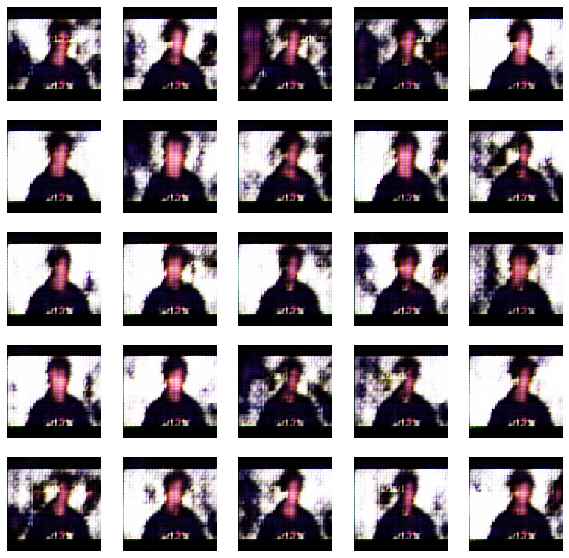

Epoch: 241,  Loss: D_real = 0.220, D_fake = 0.216,  G = 5.285
Epoch: 242,  Loss: D_real = 0.035, D_fake = 0.119,  G = 6.080
Epoch: 243,  Loss: D_real = 5.033, D_fake = 1.984,  G = 1.406
Epoch: 244,  Loss: D_real = 1.208, D_fake = 2.065,  G = 0.652
Epoch: 245,  Loss: D_real = 0.717, D_fake = 0.434,  G = 1.833
Epoch: 246,  Loss: D_real = 0.467, D_fake = 0.561,  G = 1.917
Epoch: 247,  Loss: D_real = 0.370, D_fake = 0.457,  G = 2.024
Epoch: 248,  Loss: D_real = 0.280, D_fake = 0.243,  G = 2.075
Epoch: 249,  Loss: D_real = 0.208, D_fake = 0.234,  G = 2.292
Epoch: 250,  Loss: D_real = 0.176, D_fake = 0.252,  G = 2.373


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

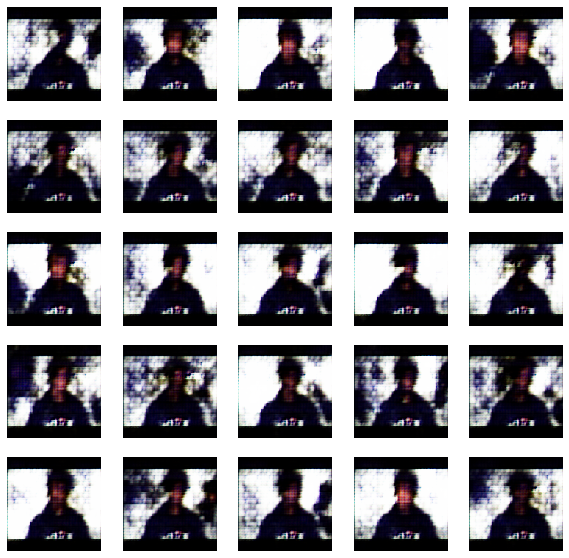

Epoch: 251,  Loss: D_real = 0.170, D_fake = 0.225,  G = 2.615
Epoch: 252,  Loss: D_real = 0.135, D_fake = 0.170,  G = 2.890
Epoch: 253,  Loss: D_real = 0.127, D_fake = 0.198,  G = 3.183
Epoch: 254,  Loss: D_real = 0.224, D_fake = 0.261,  G = 3.413
Epoch: 255,  Loss: D_real = 0.340, D_fake = 0.232,  G = 3.375
Epoch: 256,  Loss: D_real = 0.129, D_fake = 0.114,  G = 3.522
Epoch: 257,  Loss: D_real = 0.153, D_fake = 0.163,  G = 3.841
Epoch: 258,  Loss: D_real = 0.096, D_fake = 0.132,  G = 3.883
Epoch: 259,  Loss: D_real = 0.126, D_fake = 0.173,  G = 4.455
Epoch: 260,  Loss: D_real = 0.383, D_fake = 0.202,  G = 4.480


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


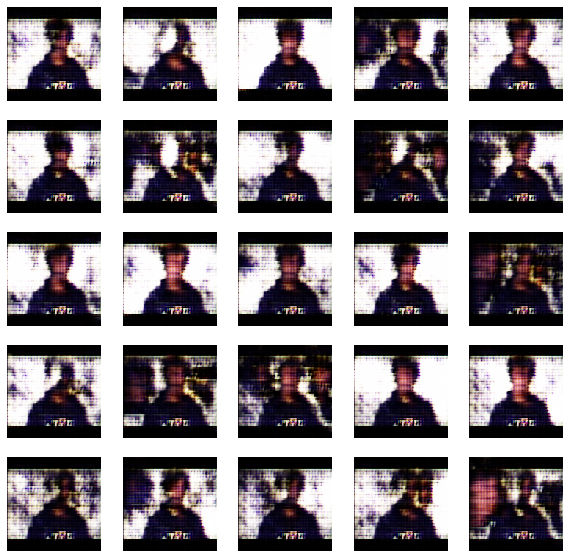

Epoch: 261,  Loss: D_real = 0.090, D_fake = 0.195,  G = 6.050
Epoch: 262,  Loss: D_real = 0.246, D_fake = 0.093,  G = 3.822
Epoch: 263,  Loss: D_real = 0.387, D_fake = 0.516,  G = 7.321
Epoch: 264,  Loss: D_real = 0.122, D_fake = 0.008,  G = 6.054
Epoch: 265,  Loss: D_real = 0.008, D_fake = 0.210,  G = 5.187
Epoch: 266,  Loss: D_real = 0.089, D_fake = 0.127,  G = 4.356
Epoch: 267,  Loss: D_real = 0.377, D_fake = 0.436,  G = 6.387
Epoch: 268,  Loss: D_real = 0.036, D_fake = 0.233,  G = 5.417
Epoch: 269,  Loss: D_real = 0.051, D_fake = 0.190,  G = 5.694
Epoch: 270,  Loss: D_real = 3.187, D_fake = 1.427,  G = 1.107


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 62%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

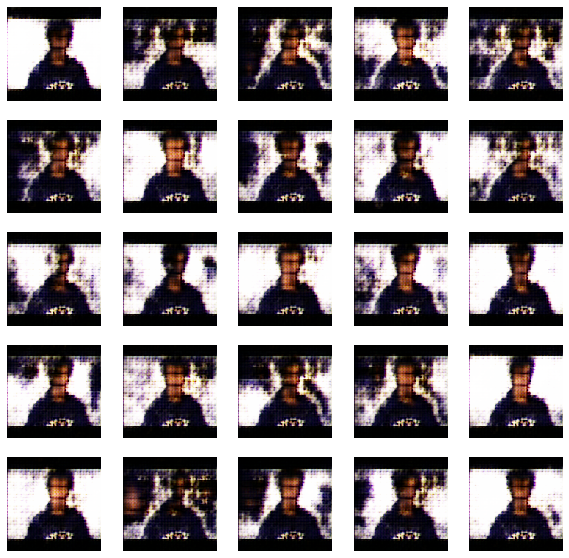

Epoch: 271,  Loss: D_real = 0.927, D_fake = 0.564,  G = 1.833
Epoch: 272,  Loss: D_real = 0.538, D_fake = 0.291,  G = 2.577
Epoch: 273,  Loss: D_real = 0.117, D_fake = 0.083,  G = 3.780
Epoch: 274,  Loss: D_real = 0.102, D_fake = 0.114,  G = 4.216
Epoch: 275,  Loss: D_real = 0.367, D_fake = 0.376,  G = 4.475
Epoch: 276,  Loss: D_real = 0.104, D_fake = 0.074,  G = 4.028
Epoch: 277,  Loss: D_real = 0.186, D_fake = 0.145,  G = 4.495
Epoch: 278,  Loss: D_real = 0.083, D_fake = 0.118,  G = 5.027
Epoch: 279,  Loss: D_real = 0.054, D_fake = 0.065,  G = 4.751
Epoch: 280,  Loss: D_real = 0.487, D_fake = 3.161,  G = 12.541


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 0%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

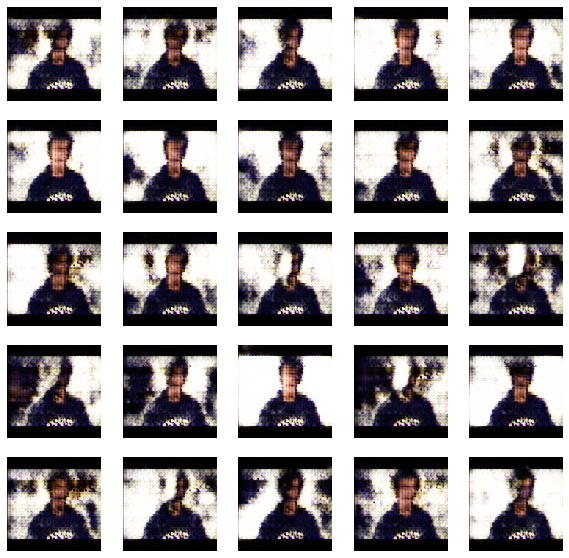

Epoch: 281,  Loss: D_real = 0.531, D_fake = 0.703,  G = 2.339
Epoch: 282,  Loss: D_real = 0.458, D_fake = 0.736,  G = 2.186
Epoch: 283,  Loss: D_real = 0.537, D_fake = 0.624,  G = 1.853
Epoch: 284,  Loss: D_real = 0.369, D_fake = 0.440,  G = 1.965
Epoch: 285,  Loss: D_real = 0.297, D_fake = 0.345,  G = 2.162
Epoch: 286,  Loss: D_real = 0.239, D_fake = 0.265,  G = 2.288
Epoch: 287,  Loss: D_real = 0.158, D_fake = 0.245,  G = 2.316
Epoch: 288,  Loss: D_real = 0.179, D_fake = 0.263,  G = 2.372
Epoch: 289,  Loss: D_real = 0.218, D_fake = 0.268,  G = 2.265
Epoch: 290,  Loss: D_real = 0.257, D_fake = 0.308,  G = 2.233


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

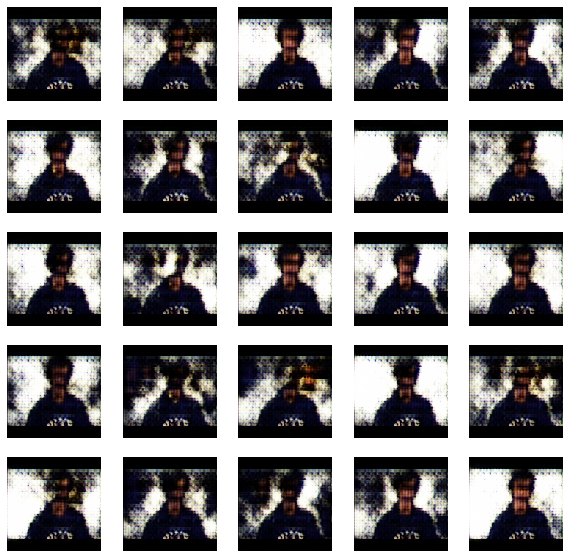

Epoch: 291,  Loss: D_real = 0.235, D_fake = 0.251,  G = 2.306
Epoch: 292,  Loss: D_real = 0.238, D_fake = 0.283,  G = 2.708
Epoch: 293,  Loss: D_real = 0.193, D_fake = 0.210,  G = 2.730
Epoch: 294,  Loss: D_real = 0.202, D_fake = 0.170,  G = 2.683
Epoch: 295,  Loss: D_real = 0.210, D_fake = 0.200,  G = 2.949
Epoch: 296,  Loss: D_real = 0.147, D_fake = 0.144,  G = 3.301
Epoch: 297,  Loss: D_real = 0.177, D_fake = 0.188,  G = 3.609
Epoch: 298,  Loss: D_real = 0.134, D_fake = 0.159,  G = 3.637
Epoch: 299,  Loss: D_real = 0.131, D_fake = 0.109,  G = 3.558
Epoch: 300,  Loss: D_real = 0.178, D_fake = 0.157,  G = 3.556


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

>Accuracy [real: 100%, fake: 100%]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

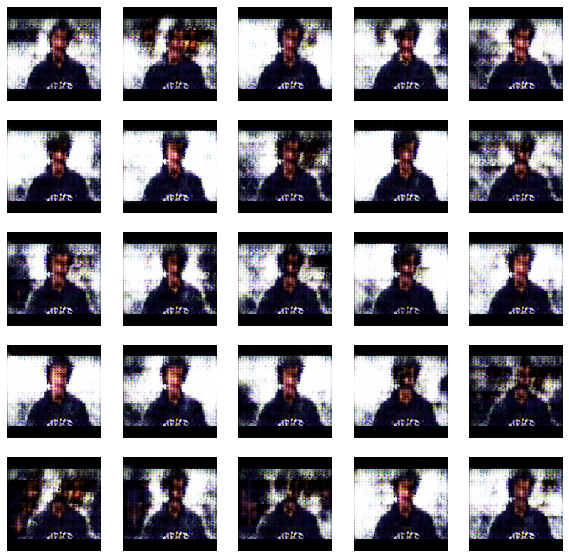

Total time for training 300 epochs is 1153.165111541748 sec


In [0]:
##setting all our values in our functions and training our model. And this will take time
discriminator = define_discriminator()
generator = define_generator(latent_dim)

# create the gan
gan = define_gan(generator, discriminator)

# train model
train(generator, discriminator, gan, dataset, latent_dim, n_epoch, batch_size)

##TODO: Get better output images!


In [0]:
##creating GIF
files = []
n_iter = int(n_epoch / 10 -1)
for e in range(n_iter):
    img_name = '/content/image_at_epoch_{:04d}.png'.format((e+1)*300)
    files.append(imageio.imread(img_name))
imageio.mimsave('dcgan_celebA_generation_animation.gif', files, fps=5)

TypeError: ignored